### Considered model: four-bar linkage (= two link manipulator + one link manipulator + rigid coupling)


This Notebook depends on symbtools >=0.2.5

→ `pip install --upgrade symbtools`





In [1]:
%load_ext ipydex.displaytools
%matplotlib inline

import sys
# to load assimulo under wsl2
sys.path.append('/home/kwrede/miniconda3/lib/python3.8/site-packages')
sys.path.append('/home/wredi/miniconda3/lib/python3.8/site-packages')

import os
import sympy as sp
import numpy as npy  # we need `np` later 
from sympy import sin, cos, pi
from sympy.interactive import printing

# using wredsen's symbtools fork (https://github.com/wredsen/symbtools @ DAE_statefeedback), assuming repos SA-Wrede and symbtools share the same parent directory
sys.path.append('../../symbtools/')
import symbtools as st
import symbtools.modeltools as mt
from symbtools.modeltools import Rz # Rotationsmatrix in the xy plane (c, -s; s, c)

import scipy as sc
import scipy.integrate as sc_integrate
from scipy.optimize import fmin
import matplotlib.pyplot as pl
from assimulo.solvers import ODASSL as SOLVER # Imports the solver ODASSL from Assimulo
from assimulo.problem import Overdetermined_Problem # Imports the problem formulation from Assimulo
import ipydex
plt = pl

printing.init_printing(1)

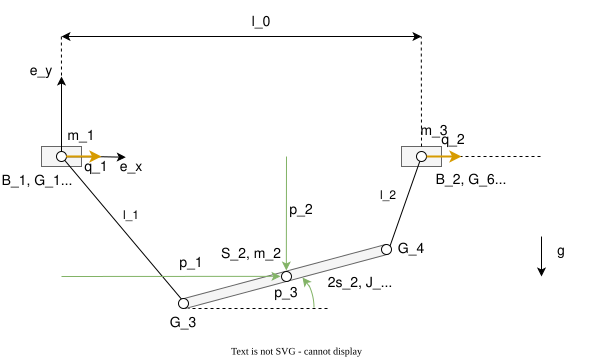

In [2]:
from IPython.display import Image
from IPython.core.display import SVG
SVG(filename='ODE_flatness_analysis_simulation_diagram.svg')

In [3]:
t = sp.Symbol('t')  # time variable

# coordinates
np = 3 # number of passive coordinates (not directly actuated)
nq = 2 # number of actuated coordinates
n = np + nq

pp = st.symb_vector("p1:{0}".format(np+1)) # vector of passive coordinates
qq = st.symb_vector("q1:{0}".format(nq+1)) # vector of actuated coordinates



# vector of control inputs
aa = st.symb_vector("a1:{0}".format(4+1)) ##:T
# vector of all coordinates
ttheta = st.row_stack(pp, qq) ##:T
# vector of velocities 
tthetad = st.time_deriv(ttheta, ttheta) ##:T
# vector of accelerations
tthetadd = st.time_deriv(ttheta, ttheta, order=2) ##:T
tthetaddd = st.time_deriv(ttheta, ttheta, order=3) ##:T
tthetadddd = st.time_deriv(ttheta, ttheta, order=4) ##:T

st.make_global(ttheta, tthetad, tthetadd, tthetaddd, tthetadddd)

QQ = st.symb_vector("Q1:{0}".format(n+1)) ##:T # vector of generalized foces
st.make_global(QQ)

aa.T := [a₁  a₂  a₃  a₄]

---

ttheta.T := [p₁  p₂  p₃  q₁  q₂]

---

tthetad.T := [ṗ₁  ṗ₂  ṗ₃  q̇₁  q̇₂]

---

tthetadd.T := [p̈₁  p̈₂  p̈₃  q̈₁  q̈₂]

---

tthetaddd.T := [p⃛₁  p⃛₂  p⃛₃  q⃛₁  q⃛₂]

---

tthetadddd.T := [p⃜₁  p⃜₂  p⃜₃  q⃜₁  q⃜₂]

---

QQ.T := [Q₁  Q₂  Q₃  Q₄  Q₅]

---

In [4]:
# symbols for analytic equations
params = sp.symbols('s2, m1, m2, m3, J1, J2, J3, mc1b, mc2b d1, d4, l0, l1, l2, l3, g')
st.make_global(params)

# symbols for control inputs
# ttau = sp.symbols('tau')
tau1, tau2, tau3, tau4 = ttau = st.symb_vector("tau1, tau2, tau3, tau4")


Specify the geometry (joints G and centers of masses S)

In [5]:
# unit vectors
ex = sp.Matrix([1, 0])
ey = sp.Matrix([0, 1])

# basis 1 and 2 (cart positions)
S1 = G1 = B1 = sp.Matrix([q1, 0]) ##:
S3 = G6 = B2 = sp.Matrix([l0 + q2, 0]) ##:

# center of gravity of load
S2 = sp.Matrix([p1, p2])

# suspension points of load
G3 = S2 - Rz(p3)*ex*s2 ##:
G4 = S2 + Rz(p3)*ex*s2 ##:

# Time derivatives of centers of masses
Sd1, Sd2, Sd3 = st.col_split(st.time_deriv(st.col_stack(S1, S2, S3), ttheta)) ##:

B1 := ⎡q₁⎤
⎢  ⎥
⎣0 ⎦

---

B2 := ⎡l₀ + q₂⎤
⎢       ⎥
⎣   0   ⎦

---

G3 := ⎡p₁ - s₂⋅cos(p₃)⎤
⎢               ⎥
⎣p₂ - s₂⋅sin(p₃)⎦

---

G4 := ⎡p₁ + s₂⋅cos(p₃)⎤
⎢               ⎥
⎣p₂ + s₂⋅sin(p₃)⎦

---

(Sd1, Sd2, Sd3) := ⎛⎡q̇₁⎤  ⎡ṗ₁⎤  ⎡q̇₂⎤⎞
⎜⎢  ⎥, ⎢  ⎥, ⎢  ⎥⎟
⎝⎣0 ⎦  ⎣ṗ₂⎦  ⎣0 ⎦⎠

---

In [6]:
# kinetic energy
T1 = (m1/2 * Sd1.T*Sd1)[0] 
T2 = (m2/2 * Sd2.T*Sd2)[0] + J2/2 * (pdot3)**2
T3 = (m3/2 * Sd3.T*Sd3)[0]

T = T1 + T2 + T3 ##:

# potential energy
V = m2*g*S2[1] ##:

---

---

this model is very easy ...

In [7]:
mod = mt.generate_symbolic_model(T, V, ttheta, QQ)
mod.eqns

⎡   -Q₁ + m₂⋅p̈₁    ⎤
⎢                  ⎥
⎢-Q₂ + g⋅m₂ + m₂⋅p̈₂⎥
⎢                  ⎥
⎢    J₂⋅p̈₃ - Q₃    ⎥
⎢                  ⎥
⎢   -Q₄ + m₁⋅q̈₁    ⎥
⎢                  ⎥
⎣   -Q₅ + m₃⋅q̈₂    ⎦

... but $Q_i$ are yet unknown → calculate them via the principle of virtual work, see e.g. [Wikipedia](https://en.wikipedia.org/wiki/Generalized_forces#Virtual_work):
$$
\delta W = \sum_{i=1}^n \mathbf {F}_{i} \cdot \frac {\partial \mathbf {r}_i} {\partial q_1} \delta q_1 +\ldots + \sum_{i=1}^n \mathbf {F}_{i} \cdot \frac {\partial \mathbf {r}_i} {\partial q_m} \delta q_m.
$$

- $ \mathbf {F}_{i}$ applied forces, i.e.  $i=1,2$ → cart-forces, $i=3,4$ → rope-foces
- $ \mathbf {r}_{i}$ position vectors of each particle (along the direction of forces): $i=1,3$ → cart, $i=2$ → load
- $ \mathbf {\delta r}_{i}$ virtual displacement
- $ \mathbf \delta q_{j} = \delta \theta_{j}$ virtual displacement of generalized coordinates


The virtual work of a system of particles can be written in the form

$$
    \delta W = Q_1\delta q_1 + \ldots + Q_m\delta q_m,
$$
where

$$
    Q_j = \sum_{i=1}^n \frac {\partial \mathbf {r}_i} {\partial q_j} \cdot \mathbf {F}_{i}  ,\quad j=1,\ldots, m, 
$$

In [8]:
F1 = sp.Matrix([tau1, 0])  ##:T
F2 = sp.Matrix([tau2, 0])  ##:T

# unit vectors for ropes to split forces according to angles
rope1 = (G3 - S1)
rope2 = (G4 - S3)
uv_rope1 = rope1/sp.sqrt((rope1.T*rope1)[0])
uv_rope2 = rope2/sp.sqrt((rope2.T*rope2)[0])

# simplify expressions by using l1, l2 as shortcuts 
uv_rope1 = rope1/l1
uv_rope2 = rope2/l2

F3 = uv_rope1 * tau3 ##:
F4 = uv_rope2 * tau4 ##:

F1.T := [τ₁  0]

---

F2.T := [τ₂  0]

---

F3 := ⎡τ₃⋅(p₁ - q₁ - s₂⋅cos(p₃))⎤
⎢─────────────────────────⎥
⎢            l₁           ⎥
⎢                         ⎥
⎢  τ₃⋅(p₂ - s₂⋅sin(p₃))   ⎥
⎢  ────────────────────   ⎥
⎣           l₁            ⎦

---

F4 := ⎡τ₄⋅(-l₀ + p₁ - q₂ + s₂⋅cos(p₃))⎤
⎢───────────────────────────────⎥
⎢               l₂              ⎥
⎢                               ⎥
⎢     τ₄⋅(p₂ + s₂⋅sin(p₃))      ⎥
⎢     ────────────────────      ⎥
⎣              l₂               ⎦

---

In [9]:
dt1, dt2, dt3, dt4, dt5 = ddelta_theta = st.symb_vector(f"\\delta\\theta_1:{n+1}") ##:

ddelta_theta := ⎡\delta\theta₁⎤
⎢             ⎥
⎢\delta\theta₂⎥
⎢             ⎥
⎢\delta\theta₃⎥
⎢             ⎥
⎢\delta\theta₄⎥
⎢             ⎥
⎣\delta\theta₅⎦

---

In [10]:
ttheta

⎡p₁⎤
⎢  ⎥
⎢p₂⎥
⎢  ⎥
⎢p₃⎥
⎢  ⎥
⎢q₁⎥
⎢  ⎥
⎣q₂⎦

In [11]:
delta_S1 = S1*0
delta_S3 = S3*0

delta_G3 = G3*0 
delta_G4 = G4*0



for theta, delta_theta in zip(ttheta, ddelta_theta):
    
    delta_S1 += S1.diff(theta)*delta_theta
    delta_S3 += S3.diff(theta)*delta_theta
    
    delta_G3 += G3.diff(theta)*delta_theta
    delta_G4 += G4.diff(theta)*delta_theta
    
delta_S1 ##:
delta_S3 ##:

delta_G3 ##:
delta_G4 ##:

(delta_S1) := ⎡\delta\theta₄⎤
⎢             ⎥
⎣      0      ⎦

---

(delta_S3) := ⎡\delta\theta₅⎤
⎢             ⎥
⎣      0      ⎦

---

(delta_G3) := ⎡\delta\theta₁ + \delta\theta₃⋅s₂⋅sin(p₃)⎤
⎢                                        ⎥
⎣\delta\theta₂ - \delta\theta₃⋅s₂⋅cos(p₃)⎦

---

(delta_G4) := ⎡\delta\theta₁ - \delta\theta₃⋅s₂⋅sin(p₃)⎤
⎢                                        ⎥
⎣\delta\theta₂ + \delta\theta₃⋅s₂⋅cos(p₃)⎦

---

In [12]:
# simple part (carts)
delta_W = delta_S1.T*F1 + delta_S3.T*F2 ##:

# rope1 (F3 > 0 means rope is pushing from S1 towards G3)
delta_W = delta_W + delta_G3.T*F3 - delta_S1.T*F3 ##:

# rope2 (F4 > 0 means rope is pushing from S3 towards G4)
delta_W = delta_W + delta_G4.T*F4 - delta_S3.T*F4 ##:

# convert from 1x1 Matrix to scalar:
# delta_W = delta_W[0, 0] ##:

delta_W := [\delta\theta₄⋅τ₁ + \delta\theta₅⋅τ₂]

---

delta_W := ⎡                   \delta\theta₄⋅τ₃⋅(p₁ - q₁ - s₂⋅cos(p₃))                   
⎢\delta\theta₄⋅τ₁ - ─────────────────────────────────────── + \delta\theta₅⋅τ₂
⎣                                      l₁                                     

   τ₃⋅(\delta\theta₁ + \delta\theta₃⋅s₂⋅sin(p₃))⋅(p₁ - q₁ - s₂⋅cos(p₃))   τ₃⋅(
 + ──────────────────────────────────────────────────────────────────── + ────
                                    l₁                                        

\delta\theta₂ - \delta\theta₃⋅s₂⋅cos(p₃))⋅(p₂ - s₂⋅sin(p₃))⎤
───────────────────────────────────────────────────────────⎥
                           l₁                              ⎦

---

delta_W := ⎡                   \delta\theta₄⋅τ₃⋅(p₁ - q₁ - s₂⋅cos(p₃))                   
⎢\delta\theta₄⋅τ₁ - ─────────────────────────────────────── + \delta\theta₅⋅τ₂
⎣                                      l₁                                     

   \delta\theta₅⋅τ₄⋅(-l₀ + p₁ - q₂ + s₂⋅cos(p₃))   τ₄⋅(\delta\theta₁ - \delta\
 - ───────────────────────────────────────────── + ───────────────────────────
                         l₂                                                   

theta₃⋅s₂⋅sin(p₃))⋅(-l₀ + p₁ - q₂ + s₂⋅cos(p₃))   τ₄⋅(\delta\theta₂ + \delta\t
─────────────────────────────────────────────── + ────────────────────────────
         l₂                                                                   

heta₃⋅s₂⋅cos(p₃))⋅(p₂ + s₂⋅sin(p₃))   τ₃⋅(\delta\theta₁ + \delta\theta₃⋅s₂⋅sin
─────────────────────────────────── + ────────────────────────────────────────
   l₂                                                                  l₁     

(p₃))⋅(p₁ - q₁ - s₂⋅cos(p₃))   τ₃⋅(\d

---

In [13]:
QQ_expr = delta_W.jacobian(ddelta_theta).T ##:

QQ_expr := ⎡                                             τ₄⋅(-l₀ + p₁ - q₂ + s₂⋅cos(p₃)) 
⎢                                             ─────────────────────────────── 
⎢                                                            l₂               
⎢                                                                             
⎢                                                     τ₄⋅(p₂ + s₂⋅sin(p₃))   τ
⎢                                                     ──────────────────── + ─
⎢                                                              l₂             
⎢                                                                             
⎢s₂⋅τ₄⋅(p₂ + s₂⋅sin(p₃))⋅cos(p₃)   s₂⋅τ₄⋅(-l₀ + p₁ - q₂ + s₂⋅cos(p₃))⋅sin(p₃) 
⎢─────────────────────────────── - ────────────────────────────────────────── 
⎢               l₂                                     l₂                     
⎢                                                                             
⎢                                        

---

In [14]:
mod.eqns

⎡   -Q₁ + m₂⋅p̈₁    ⎤
⎢                  ⎥
⎢-Q₂ + g⋅m₂ + m₂⋅p̈₂⎥
⎢                  ⎥
⎢    J₂⋅p̈₃ - Q₃    ⎥
⎢                  ⎥
⎢   -Q₄ + m₁⋅q̈₁    ⎥
⎢                  ⎥
⎣   -Q₅ + m₃⋅q̈₂    ⎦

In [15]:
eqns = mod.eqns.subz(QQ, QQ_expr) ##:

eqns := ⎡                                                     τ₄⋅(-l₀ + p₁ - q₂ + s₂⋅c
⎢                                             m₂⋅p̈₁ - ───────────────────────
⎢                                                                    l₂       
⎢                                                                             
⎢                                                                τ₄⋅(p₂ + s₂⋅s
⎢                                                 g⋅m₂ + m₂⋅p̈₂ - ────────────
⎢                                                                         l₂  
⎢                                                                             
⎢        s₂⋅τ₄⋅(p₂ + s₂⋅sin(p₃))⋅cos(p₃)   s₂⋅τ₄⋅(-l₀ + p₁ - q₂ + s₂⋅cos(p₃))⋅
⎢J₂⋅p̈₃ - ─────────────────────────────── + ──────────────────────────────────
⎢                       l₂                                     l₂             
⎢                                                                             
⎢                                           

---

In [16]:
eqns.jacobian(ttau)

⎡                            -(p₁ - q₁ - s₂⋅cos(p₃))                          
⎢0   0                       ────────────────────────                         
⎢                                       l₁                                    
⎢                                                                             
⎢                              -(p₂ - s₂⋅sin(p₃))                             
⎢0   0                         ───────────────────                            
⎢                                       l₁                                    
⎢                                                                             
⎢        s₂⋅(p₂ - s₂⋅sin(p₃))⋅cos(p₃)   s₂⋅(p₁ - q₁ - s₂⋅cos(p₃))⋅sin(p₃)    s
⎢0   0   ──────────────────────────── - ─────────────────────────────────  - ─
⎢                     l₁                                l₁                    
⎢                                                                             
⎢                              p₁ - q₁ - s₂⋅cos(p₃) 

In [17]:
# eliminate the last two equations and tau1,2 → 3 remaining

In [18]:
eqns1 = eqns[:-2, :] ##:

eqns1 := ⎡                                                     τ₄⋅(-l₀ + p₁ - q₂ + s₂⋅c
⎢                                             m₂⋅p̈₁ - ───────────────────────
⎢                                                                    l₂       
⎢                                                                             
⎢                                                                τ₄⋅(p₂ + s₂⋅s
⎢                                                 g⋅m₂ + m₂⋅p̈₂ - ────────────
⎢                                                                         l₂  
⎢                                                                             
⎢        s₂⋅τ₄⋅(p₂ + s₂⋅sin(p₃))⋅cos(p₃)   s₂⋅τ₄⋅(-l₀ + p₁ - q₂ + s₂⋅cos(p₃))⋅
⎢J₂⋅p̈₃ - ─────────────────────────────── + ──────────────────────────────────
⎣                       l₂                                     l₂             

os(p₃))   τ₃⋅(p₁ - q₁ - s₂⋅cos(p₃))                                           
──────── - ─────────────────────────      

---

In [19]:
# TODO: Warum können tau1,2 eliminiert werden -> Zshg. zu eqns erste beiden Spalten!
ttau1 = ttau[2:, :] ##:

ttau1 := ⎡τ₃⎤
⎢  ⎥
⎣τ₄⎦

---

now we have two inputs distributed over three equations. The $3\times 2$ coefficient matrix $B_1$ is the following:

In [20]:
B1 = eqns1.jacobian(ttau1) ##:

B1 := ⎡                    -(p₁ - q₁ - s₂⋅cos(p₃))                                  
⎢                    ────────────────────────                                 
⎢                               l₁                                            
⎢                                                                             
⎢                      -(p₂ - s₂⋅sin(p₃))                                     
⎢                      ───────────────────                                    
⎢                               l₁                                            
⎢                                                                             
⎢s₂⋅(p₂ - s₂⋅sin(p₃))⋅cos(p₃)   s₂⋅(p₁ - q₁ - s₂⋅cos(p₃))⋅sin(p₃)    s₂⋅(p₂ + 
⎢──────────────────────────── - ─────────────────────────────────  - ─────────
⎣             l₁                                l₁                            

          -(-l₀ + p₁ - q₂ + s₂⋅cos(p₃))                      ⎤
          ──────────────────────────────                     

---

We need its left pseudoinverse, i.e. the $2 \times 3$ matrix $B_1^{L+}$ with $B_1^{L+} B_1 = I_2$ and its left Orthocomplement $B_1^{L\perp}$ ($1 \times 3$) with $B_1^{L\perp} B_1 = 0_{1 \times 2}$

Note: both matrices are not unique: There are infinitely many Pseudoinverses and Othocomplements.

In [21]:
B1pinv = B1[:2, :].inverse_ADJ() # this is 2 x 2
B1pinv = st.col_stack(B1pinv, sp.Matrix([0, 0])) ##:

B1pinv.shape ##:

B1pinv := ⎡                                              ⎛  p₂   s₂⋅sin(p₃)⎞            
⎢                                        l₁⋅l₂⋅⎜- ── - ──────────⎟            
⎢                                              ⎝  l₂       l₂    ⎠            
⎢─────────────────────────────────────────────────────────────────────────────
⎢l₀⋅p₂ - l₀⋅s₂⋅sin(p₃) + 2⋅p₁⋅s₂⋅sin(p₃) - p₂⋅q₁ + p₂⋅q₂ - 2⋅p₂⋅s₂⋅cos(p₃) - q
⎢                                                                             
⎢                                               ⎛p₂   s₂⋅sin(p₃)⎞             
⎢                                         l₁⋅l₂⋅⎜── - ──────────⎟             
⎢                                               ⎝l₁       l₁    ⎠             
⎢─────────────────────────────────────────────────────────────────────────────
⎣l₀⋅p₂ - l₀⋅s₂⋅sin(p₃) + 2⋅p₁⋅s₂⋅sin(p₃) - p₂⋅q₁ + p₂⋅q₂ - 2⋅p₂⋅s₂⋅cos(p₃) - q

                                                                              
                                         

---

---

In [22]:
# check
tmp = (B1pinv * B1).smplf ##:


assert tmp == sp.eye(2)

tmp := ⎡1  0⎤
⎢    ⎥
⎣0  1⎦

---

In [23]:
# nullspace(~kernel) (orthocomplement)

A = st.symbMatrix(3, 2)##:

A := ⎡a₁₁  a₁₂⎤
⎢        ⎥
⎢a₂₁  a₂₂⎥
⎢        ⎥
⎣a₃₁  a₃₂⎦

---

In [24]:
A_ortho = st.nullspaceMatrix(A.T).T ##:

A_ortho := [a₂₁⋅a₃₂ - a₂₂⋅a₃₁  -a₁₁⋅a₃₂ + a₁₂⋅a₃₁  a₁₁⋅a₂₂ - a₁₂⋅a₂₁]

---

In [25]:
# check

(A.T * A_ortho.T).smplf

⎡0⎤
⎢ ⎥
⎣0⎦

In [26]:
# TODO: Was passiert hier genau bzw. wieso?
B1_ortho = A_ortho.subz(list(A), list(B1)).smplf*l1*l2 ##:

B1_ortho := ⎡   ⎛                         2                             2                 
⎣s₂⋅⎝l₀⋅p₂⋅sin(p₃) - l₀⋅s₂⋅sin (p₃) - 2⋅p₁⋅p₂⋅sin(p₃) + 2⋅p₂ ⋅cos(p₃) + p₂⋅q₁⋅

                                   2                2    ⎞                    
sin(p₃) + p₂⋅q₂⋅sin(p₃) + q₁⋅s₂⋅sin (p₃) - q₂⋅s₂⋅sin (p₃)⎠  s₂⋅((-p₁ + q₁ + s₂

                                                                              
⋅cos(p₃))⋅(l₀⋅sin(p₃) - p₁⋅sin(p₃) + p₂⋅cos(p₃) + q₂⋅sin(p₃)) + (-p₁⋅sin(p₃) +

                                                                              
 p₂⋅cos(p₃) + q₁⋅sin(p₃))⋅(l₀ - p₁ + q₂ - s₂⋅cos(p₃)))  (p₂ - s₂⋅sin(p₃))⋅(l₀ 

                                                                   ⎤
- p₁ + q₂ - s₂⋅cos(p₃)) - (p₂ + s₂⋅sin(p₃))⋅(-p₁ + q₁ + s₂⋅cos(p₃))⎦

---

In [27]:
# check orthocomplement property:
res = (B1_ortho * B1).smplf ##:
assert not any(res)

res := [0  0]

---

Now we can assemble the $3\times 3$ transformation matrix:

$$
W_1 = 
\left(\begin{matrix}
B_1^{L+} \\
B_1^{L\perp}
\end{matrix} \right)
$$

In [28]:
W1 = st.row_stack(B1pinv, B1_ortho) ##:i

info(W1) := "<class 'sympy.matrices.dense.MutableDenseMatrix'> with count_ops: Matrix([[37, 36, 0], [36, 34, 0], [38, 33, 19]])"

---

In [29]:
W1

⎡                                                             ⎛  p₂   s₂⋅sin(p
⎢                                                       l₁⋅l₂⋅⎜- ── - ────────
⎢                                                             ⎝  l₂       l₂  
⎢               ──────────────────────────────────────────────────────────────
⎢               l₀⋅p₂ - l₀⋅s₂⋅sin(p₃) + 2⋅p₁⋅s₂⋅sin(p₃) - p₂⋅q₁ + p₂⋅q₂ - 2⋅p₂
⎢                                                                             
⎢                                                              ⎛p₂   s₂⋅sin(p₃
⎢                                                        l₁⋅l₂⋅⎜── - ─────────
⎢                                                              ⎝l₁       l₁   
⎢               ──────────────────────────────────────────────────────────────
⎢               l₀⋅p₂ - l₀⋅s₂⋅sin(p₃) + 2⋅p₁⋅s₂⋅sin(p₃) - p₂⋅q₁ + p₂⋅q₂ - 2⋅p₂
⎢                                                                             
⎢   ⎛                         2                     

In [30]:
eqns2 = (W1*eqns1).smplf ##:

eqns2 := ⎡                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢                                                                             
⎢s₂⋅((-p₁ + q₁ + s₂⋅cos(p₃))⋅(l₀⋅sin(p₃) - p₁⋅sin(p₃) + p₂⋅cos(p₃) + q₂⋅sin(p₃
⎢─────────────────────────────────────────────────────────────────────────────
⎣                                                                             

                                          

---

In [31]:
ttau1

⎡τ₃⎤
⎢  ⎥
⎣τ₄⎦

In [32]:
B2 = eqns2.jacobian(ttau1).smplf ##:
assert B2 == sp.eye(3)[:, :2]

B2 := ⎡1  0⎤
⎢    ⎥
⎢0  1⎥
⎢    ⎥
⎣0  0⎦

---

In [33]:
# eliminate the first two equations and tau3, tau4
eqn3 = eqns2[-1, 0] *l1*l2 ##:

---

In [34]:
eqn3.expand().s

In `eqn3` $q_1, q_2$ only occur algebraicly:  the structure is $0 = \kappa_0 + \kappa_{1, 0} q_1+ \kappa_{0,1} q_2 + \kappa_{1, 1} q_1 q_2$. Thus, $q_2$ (or $q_1$) can be eliminated, together with the last equation.

The remaining quantities form the flat output: $\mathbf{y} = (p_1, p_2, p_3, q_1)^T$.

All other quantities can be derived from $\mathbf y(\cdot)$: $q_2$ from `eqn3` and then the inputs from the earlier eliminated equations. Togehter the eliminated equations yield the parametrization of the system quantities by the flat output.

In [35]:
kappa_10 = eqn3.diff(q1).subs(q2, 0).smplf
kappa_01 = eqn3.diff(q2).subs(q1, 0).smplf
kappa_11 = eqn3.diff(q1).diff(q2).smplf

In [36]:
kappa_0 = (eqn3 - kappa_10*q1 - kappa_01*q2 - kappa_11*q1*q2).smplf

In [37]:
kk = sp.Matrix([kappa_0, kappa_01, kappa_10, kappa_11])

In [38]:
kk.s

# System parameterization by flat output

In [39]:
flat_q2 = sp.matrices.dense.MutableDenseMatrix(sp.solve(eqn3, q2))
flat_q2 = flat_q2.smplf
flat_q2.s ##:

---

In [40]:
# time derivative of q2 used later
flat_qddot2 = st.time_deriv(flat_q2, ttheta, order=2)
flat_qddot2.s ##:

---

In [41]:
flat_tau4 = sp.matrices.dense.MutableDenseMatrix(sp.solve(eqns2[1], tau4)) 
flat_tau4 = flat_tau4.subz([l2], [sp.sqrt((rope2.T*rope2)[0])]) # substituting l2 for variable rope length
flat_tau4 = flat_tau4.subz([q2], flat_q2)
flat_tau4.s ##:

---

In [42]:
flat_tau3 =  sp.matrices.dense.MutableDenseMatrix(sp.solve(eqns2[0], tau3)) 
flat_tau3 = flat_tau3.subz([l1], [sp.sqrt((rope1.T*rope1)[0])]) # substituting l1 for variable rope length
flat_tau3 = flat_tau3.subz([q2], flat_q2)
flat_tau3.s ##:

---

In [43]:
flat_tau2 = sp.matrices.dense.MutableDenseMatrix(sp.solve(eqns[-1], tau2))
flat_tau2 = flat_tau2.subz([l2], [sp.sqrt((rope2.T*rope2)[0])]) # substituting l2 for variable rope length
flat_tau2 = flat_tau2.subz([q2, qddot2, tau4, tau3], [*flat_q2, *flat_qddot2, *flat_tau4, *flat_tau3])
flat_tau2.s ##:

---

In [44]:
flat_tau1 = sp.matrices.dense.MutableDenseMatrix(sp.solve(eqns[-2], tau1))
flat_tau1 = flat_tau1.subz([l1], [sp.sqrt((rope1.T*rope1)[0])]) # substituting l1 for variable rope length
flat_tau1 = flat_tau1.subz([q2, tau4, tau3], [*flat_q2, *flat_tau4, *flat_tau3])
flat_tau1.s ##:

---

# Initial values

In [45]:
# resubstitute the rope lengths:
mod.eqns = eqns.subz([l1, l2], [sp.sqrt((rope1.T*rope1)[0]), sp.sqrt((rope2.T*rope2)[0])])

In [46]:
mod.eqns

⎡                                                                           τ₃
⎢                                                       m₂⋅p̈₁ - ─────────────
⎢                                                                  ___________
⎢                                                                 ╱           
⎢                                                               ╲╱  (p₂ - s₂⋅s
⎢                                                                             
⎢                                                                             
⎢                                                   g⋅m₂ + m₂⋅p̈₂ - ──────────
⎢                                                                     ________
⎢                                                                    ╱        
⎢                                                                  ╲╱  (p₂ - s
⎢                                                                             
⎢                 s₂⋅τ₃⋅(p₂ - s₂⋅sin(p₃))⋅cos(p₃)   

In [47]:
mod.tau = ttau

In [48]:
mod.calc_state_eq(force_recalculation=True)

In [49]:
mod.f

⎡ṗ₁⎤
⎢  ⎥
⎢ṗ₂⎥
⎢  ⎥
⎢ṗ₃⎥
⎢  ⎥
⎢q̇₁⎥
⎢  ⎥
⎢q̇₂⎥
⎢  ⎥
⎢0 ⎥
⎢  ⎥
⎢-g⎥
⎢  ⎥
⎢0 ⎥
⎢  ⎥
⎢0 ⎥
⎢  ⎥
⎣0 ⎦

In [50]:
mod.g

⎡0   0                             0                                          
⎢                                                                             
⎢0   0                             0                                          
⎢                                                                             
⎢0   0                             0                                          
⎢                                                                             
⎢0   0                             0                                          
⎢                                                                             
⎢0   0                             0                                          
⎢                                                                             
⎢                         p₁ - q₁ - s₂⋅cos(p₃)                                
⎢0   0   ─────────────────────────────────────────────────────  ──────────────
⎢              _____________________________________

In [51]:
sys_params = list(dict(J2=0.004553475, g=9.81, l0=0.3, m1=0.45, m2=0.557, m3=0.45, s2=0.15).items()) ##:

sys_params := [('J2', 0.004553475),
 ('g', 9.81),
 ('l0', 0.3),
 ('m1', 0.45),
 ('m2', 0.557),
 ('m3', 0.45),
 ('s2', 0.15)]

---

In [52]:
eqns.subz0(tthetadd)

⎡                                               τ₄⋅(-l₀ + p₁ - q₂ + s₂⋅cos(p₃)
⎢                                             - ──────────────────────────────
⎢                                                              l₂             
⎢                                                                             
⎢                                                         τ₄⋅(p₂ + s₂⋅sin(p₃))
⎢                                                  g⋅m₂ - ────────────────────
⎢                                                                  l₂         
⎢                                                                             
⎢  s₂⋅τ₄⋅(p₂ + s₂⋅sin(p₃))⋅cos(p₃)   s₂⋅τ₄⋅(-l₀ + p₁ - q₂ + s₂⋅cos(p₃))⋅sin(p₃
⎢- ─────────────────────────────── + ─────────────────────────────────────────
⎢                 l₂                                     l₂                   
⎢                                                                             
⎢                                                   

In [53]:
# determine a symetrical equilibrium:
# TODO: woher Wahl von ttau?
eqlbr_conditions = [(q1, 0), (p1, 0.15), (p2, -0.4), (p3, 0), (tau1, 0), (tau2, 0), (tau3, tau4)] ##:

res = ((mod.eqns.subz0(tthetadd)).subs(eqlbr_conditions)).subs(sys_params) ##:

---

res := ⎡              q₂⋅τ₄               ⎤
⎢         ───────────────          ⎥
⎢            ____________          ⎥
⎢           ╱   2                  ⎥
⎢         ╲╱  q₂  + 0.16           ⎥
⎢                                  ⎥
⎢              0.4⋅τ₄              ⎥
⎢1.0⋅τ₄ + ─────────────── + 5.46417⎥
⎢            ____________          ⎥
⎢           ╱   2                  ⎥
⎢         ╲╱  q₂  + 0.16           ⎥
⎢                                  ⎥
⎢                   0.06⋅τ₄        ⎥
⎢    -0.15⋅τ₄ + ───────────────    ⎥
⎢                  ____________    ⎥
⎢                 ╱   2            ⎥
⎢               ╲╱  q₂  + 0.16     ⎥
⎢                                  ⎥
⎢                0                 ⎥
⎢                                  ⎥
⎢             -q₂⋅τ₄               ⎥
⎢         ───────────────          ⎥
⎢            ____________          ⎥
⎢           ╱   2                  ⎥
⎣         ╲╱  q₂  + 0.16           ⎦

---

In [54]:
symbs = list(res.s) ##:
sol = sp.solve(res, symbs, dict=True) ##:

---

---

In [55]:
ttheta0 = st.to_np(ttheta.subs(eqlbr_conditions).subs(q2,0)).squeeze() ##:

uu0 = st.to_np(ttau.subs(eqlbr_conditions).subs(tau4, -2.732085)).squeeze()##:

ttheta0 := array([ 0.15, -0.4 ,  0.  ,  0.  ,  0.  ])

---

uu0 := array([ 0.      ,  0.      , -2.732085, -2.732085])

---

# Trajectory planning
The parametrization of $\tau_2$ determines the highest required order $N_i$ of the flat output's derivatives. For each component of the flat output a trajectory $y_i$ can be chosen with a polynomial order of $\alpha_i = 2 N_i + 1$ in compliance with the system's initial values.

In [56]:
T0, T1 = 0, 10
p10, p20, p30, q10 = ttheta0[:-1] ##:
p1e, p2e, p3e, q1e = ttheta0[:-1] - 0.3 ##:
# polynoms of order 9 (boundary conditions until 4th derivative) for p_i
p1_traj = st.condition_poly(t, (T0, p10, 0, 0, 0, 0), (T1, p1e, 0, 0, 0, 0)) ##:
p2_traj = st.condition_poly(t, (T0, p20, 0, 0, 0, 0), (T1, p2e, 0, 0, 0, 0)) ##:
p3_traj = st.condition_poly(t, (T0, p30, 0, 0, 0, 0), (T1, p3e, 0, 0, 0, 0)) ##:
# polynoms of order 5 (boundary conditions until 2nd derivative) for q_1
q1_traj = st.condition_poly(t, (T0, q10, 0, 0), (T1, q1e, 0, 0)) ##:

---

---

---

---

---

---

Substitution of $\mathbf{y}$ with trajectories into control inputs

In [57]:
flat_quantities = [p1, p2, p3, q1,
                   pdot1, pdot2, pdot3, qdot1, 
                   pddot1, pddot2, pddot3, qddot1,
                   pdddot1, pdddot2, pdddot3, 
                   pddddot1, pddddot2, pddddot3]

flat_quant_subs = [p1_traj, p2_traj, p3_traj, q1_traj,
                   p1_traj.diff(t), p2_traj.diff(t), p3_traj.diff(t), q1_traj.diff(t),
                   p1_traj.diff(t, 2), p2_traj.diff(t, 2), p3_traj.diff(t, 2), q1_traj.diff(t, 2),
                   p1_traj.diff(t, 3), p2_traj.diff(t, 3), p3_traj.diff(t, 3),
                   p1_traj.diff(t, 4), p2_traj.diff(t, 4), p3_traj.diff(t, 4)]


In [58]:
tau1_traj = flat_tau1.subz(flat_quantities, flat_quant_subs)
tau2_traj = flat_tau2.subz(flat_quantities, flat_quant_subs)
tau3_traj = flat_tau3.subz(flat_quantities, flat_quant_subs)
tau4_traj = flat_tau4.subz(flat_quantities, flat_quant_subs)

# verify that only constant system parameters and the time quantity are included
set([*tau1_traj.s, *tau2_traj.s, *tau3_traj.s, *tau4_traj.s]) ##:

---

In [59]:
# replace system parameters with numerical values
tau1_traj_num = tau1_traj.subs(sys_params)
tau2_traj_num = tau2_traj.subs(sys_params)
tau3_traj_num = tau3_traj.subs(sys_params)
tau4_traj_num = tau4_traj.subs(sys_params)

# create callable function from symbolic expressions:
tau1_traj_func = st.expr_to_func(t, tau1_traj_num)
tau2_traj_func = st.expr_to_func(t, tau2_traj_num)
tau3_traj_func = st.expr_to_func(t, tau3_traj_num)
tau4_traj_func = st.expr_to_func(t, tau4_traj_num)

# Simulation model

In [60]:
mod.xx

⎡p₁⎤
⎢  ⎥
⎢p₂⎥
⎢  ⎥
⎢p₃⎥
⎢  ⎥
⎢q₁⎥
⎢  ⎥
⎢q₂⎥
⎢  ⎥
⎢ṗ₁⎥
⎢  ⎥
⎢ṗ₂⎥
⎢  ⎥
⎢ṗ₃⎥
⎢  ⎥
⎢q̇₁⎥
⎢  ⎥
⎣q̇₂⎦

In [61]:
sim = st.SimulationModel(mod.f, mod.g, mod.xx, model_parameters=sys_params)

In [62]:
# control forces for stabilizing equilbrium
uu1 = npy.array([  0  ,   0.  , -2.732085, -2.732085])
def composite_force(x, t):
    # friction constants
    di = 10
    dissipation1 = -di*x[8]
    dissipation2 = -di*x[9]
    control_force = 0
    
    forces = uu1 #+ [dissipation1, dissipation2, 0.0, 0.0]
    return forces

# control forces for driving feed forward trajectories
def feed_forward_traj(x, t):
    if t < 1e-2:
        forces = uu1        
    elif t < 9.99:
        u1 = tau1_traj_func(t)
        u2 = tau2_traj_func(t)
        u3 = tau3_traj_func(t)
        u4 = tau4_traj_func(t)
        forces = [u1, u2, u3, u4]
    else:
        u1 = tau1_traj_func(9.99)
        u2 = tau2_traj_func(9.99)
        u3 = tau3_traj_func(9.99)
        u4 = tau4_traj_func(9.99)
        forces = [u1, u2, u3, u4]
    return forces

rhs = sim.create_simfunction(controller_function=feed_forward_traj)

In [63]:
xx0 = npy.concatenate((ttheta0, ttheta0*0)) ##:

xx0 := array([ 0.15, -0.4 ,  0.  ,  0.  ,  0.  ,  0.  , -0.  ,  0.  ,  0.  ,  0.  ])

---

In [64]:
tt = npy.linspace(0, 20, 2000)

In [65]:
# solve_ivp is more modern, but the signature of rhs is taylored towards odeint
res = sc_integrate.odeint(rhs, xx0, tt) ##:i

10
10
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
10
10
10
10
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
10
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
10
10
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1


1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1
1
1
10
1
1

info(res) := "<class 'numpy.ndarray'> with shape: (2000, 10)"

---

In [66]:
mod.tt

⎡p₁⎤
⎢  ⎥
⎢p₂⎥
⎢  ⎥
⎢p₃⎥
⎢  ⎥
⎢q₁⎥
⎢  ⎥
⎣q₂⎦

In [67]:
res[0, :]

array([ 0.15, -0.4 ,  0.  ,  0.  ,  0.  ,  0.  , -0.  ,  0.  ,  0.  ,  0.  ])

In [68]:
res[100, :]

array([ 1.49732152e-01, -4.00267902e-01, -2.67898638e-04, -2.57174868e-03,  1.67620214e-03, -1.24223879e-03, -1.24222976e-03, -1.24221830e-03, -7.29699805e-03,  3.94453068e-03])

In [69]:
# numeric trajs
p1_num = st.expr_to_func(t, p1_traj)
p2_num = st.expr_to_func(t, p2_traj)
p3_num = st.expr_to_func(t, p3_traj)
q1_num = st.expr_to_func(t, q1_traj)
# deviation of real and planned trajs
err_trajp1 = npy.mean(abs(res[:1000, 0] - p1_num(tt[tt<10]))) ##:
err_trajp2 = npy.mean(abs(res[:1000, 1] - p2_num(tt[tt<10]))) ##:
err_trajp3 = npy.mean(abs(res[:1000, 2] - p3_num(tt[tt<10]))) ##:
err_trajq1 = npy.mean(abs(res[:1000, 3] - q1_num(tt[tt<10]))) ##:

1


---

1


---

1


---

1


---

In [70]:
ttau = list(map(feed_forward_traj, npy.zeros(1499) ,tt[1:1500]))
ttau1, ttau2, ttau3, ttau4 = zip(*ttau)

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


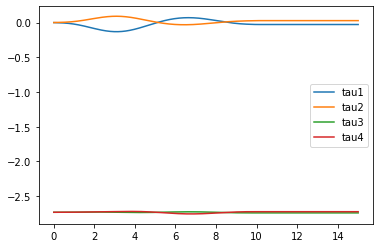

In [71]:
plt.plot(tt[1:1500], ttau1, label="tau1")
plt.plot(tt[1:1500], ttau2, label="tau2")
plt.plot(tt[1:1500], ttau3, label="tau3")
plt.plot(tt[1:1500], ttau4, label="tau4")
plt.legend()

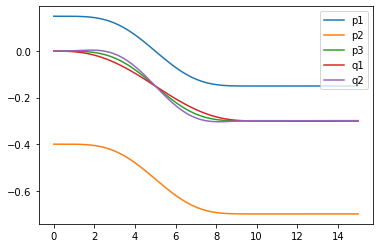

In [72]:
plt.plot(tt[:1500], res[:1500, 0], label="p1")
plt.plot(tt[:1500], res[:1500, 1], label="p2")
plt.plot(tt[:1500], res[:1500, 2], label="p3")
plt.plot(tt[:1500], res[:1500, 3], label="q1")
plt.plot(tt[:1500], res[:1500, 4], label="q2")
plt.legend()

In [73]:
joint_pos_expr = st.col_stack(G1, G3, G4, G6).subs(sys_params) ##:
joint_pos_func = st.expr_to_func(mod.tt, joint_pos_expr, keep_shape=True)

joint_pos_expr := ⎡q₁  p₁ - 0.15⋅cos(p₃)  p₁ + 0.15⋅cos(p₃)  q₂ + 0.3⎤
⎢                                                  ⎥
⎣0   p₂ - 0.15⋅sin(p₃)  p₂ + 0.15⋅sin(p₃)     0    ⎦

---

8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8
8


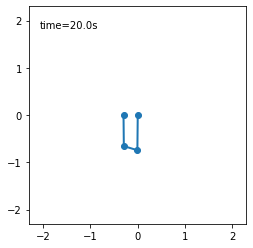

In [74]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = pl.figure() 
ax = fig.add_subplot(111, autoscale_on=False, xlim=(-2.3,2.3), ylim=(-2.3,2.3))
ax.set_aspect('equal')

line, = ax.plot([],[],'o-', lw=2)
time_template = 'time=%.1fs'
time_text = ax.text(0.05, 0.9, '', transform=ax.transAxes)
dt = tt[1] - tt[0]


def init():
    line.set_data([],[])
    time_text.set_text('')
    return line, time_text

l1 =1.0

def animate(i):
    xx, yy = joint_pos_func(*res[i, :res.shape[1]//2])
    
    line.set_data(xx,yy)
    time_text.set_text(time_template%(i*dt))
    
    return line, time_text


ani = animation.FuncAnimation(fig, animate, range(res.shape[0]), interval=tt[-1]*3, blit=True, init_func=init)


# this animation is nice but results in a big notebook file which is unwanted for publication in the repo
HTML(ani.to_jshtml())



